# Aadhaar Data Analysis Report (Sep - Dec 2025)

## 1. Problem Statement & Context
This analysis uncovers societal trends using 9 specific KPIs across three strategic angles (Migration, Maturity, Accessibility) and concludes with a **Strategic Action Framework** mapped to the geography of India.

## 2. Methodology
- **Data Sources**: Aggregated anonymized CSVs.
- **Filter**: Sep 2025 - Dec 2025 (Reliable Window).
- **Technique**: Data Cleaning -> KPI Calculation -> Strategic Classification.
- **Standardization**: Strict adherence to official Indian State/UT formatting.

---

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import glob
import os
import numpy as np
import json
from urllib.request import urlopen

# Set renderer to notebook
pio.renderers.default = "notebook"

# VISUALIZATION SETTINGS
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)
COLOR_INFANT = '#1f77b4' # Blue
COLOR_ADULT = '#ff7f0e'  # Orange
COLOR_UPDATE = '#d62728' # Red

# CANONICAL STATE NAMES (User Defined)
VALID_STATES = {
    # States
    "Andhra Pradesh", "Arunachal Pradesh", "Assam", "Bihar", "Chhattisgarh", "Goa", "Gujarat", "Haryana",
    "Himachal Pradesh", "Jharkhand", "Karnataka", "Kerala", "Madhya Pradesh", "Maharashtra", "Manipur",
    "Meghalaya", "Mizoram", "Nagaland", "Odisha", "Punjab", "Rajasthan", "Sikkim", "Tamil Nadu",
    "Telangana", "Tripura", "Uttar Pradesh", "Uttarakhand", "West Bengal",
    # Union Territories
    "Andaman and Nicobar Islands", "Chandigarh", "Dadra & Nagar Haveli and Daman & Diu", "Delhi (NCT)",
    "Jammu and Kashmir", "Ladakh", "Lakshadweep", "Puducherry"
}

# LOAD & CLEAN DATA
BIO_PATH = 'c:/Users/Dell/data_hackathon/api_data_aadhar_biometric'
DEMO_PATH = 'c:/Users/Dell/data_hackathon/api_data_aadhar_demographic'
ENROL_PATH = 'c:/Users/Dell/data_hackathon/api_data_aadhar_enrolment'

def load_data(path, pattern='*.csv'):
    files = glob.glob(os.path.join(path, pattern))
    if not files: return pd.DataFrame()
    dfs = [pd.read_csv(f) for f in files]
    return pd.concat(dfs, ignore_index=True)

def preprocess_and_merge():
    bio_df = load_data(BIO_PATH)
    demo_df = load_data(DEMO_PATH)
    enrol_df = load_data(ENROL_PATH)
    
    def clean(df, date_col='date'):
        df[date_col] = pd.to_datetime(df[date_col], format='%d-%m-%Y', errors='coerce')
        # Initial Normalization
        df['state'] = df['state'].astype(str).str.strip().str.title()
        df['district'] = df['district'].astype(str).str.strip().str.title()
        
        # EXTENSIVE MAPPING to Valid List
        mapping = {
            'Westbengal': 'West Bengal', 'West Bangal': 'West Bengal', 
            'Andaman And Nicobar Islands': 'Andaman and Nicobar Islands', 'Andaman & Nicobar Islands': 'Andaman and Nicobar Islands',
            'Dadra And Nagar Haveli': 'Dadra & Nagar Haveli and Daman & Diu', 'Daman And Diu': 'Dadra & Nagar Haveli and Daman & Diu',
            'Dadra & Nagar Haveli': 'Dadra & Nagar Haveli and Daman & Diu',
            'Jammu And Kashmir': 'Jammu and Kashmir', 'Jammu & Kashmir': 'Jammu and Kashmir',
            'Nct Of Delhi': 'Delhi (NCT)', 'Delhi': 'Delhi (NCT)',
            'Orissa': 'Odisha', 'Pondicherry': 'Puducherry', 'Lakshadweep': 'Lakshadweep', 'Ladakh': 'Ladakh',
            'Chattisgarh': 'Chhattisgarh'
        }
        df['state'] = df['state'].replace(mapping)
        
        # Strict Filtering
        df = df[df['state'].isin(VALID_STATES)]
        return df.dropna(subset=[date_col])

    bio_df = clean(bio_df)
    demo_df = clean(demo_df)
    enrol_df = clean(enrol_df)
    
    # Aggregation
    bio_df['Total_Biometric'] = bio_df['bio_age_5_17'] + bio_df['bio_age_17_']
    demo_df['Total_Demographic'] = demo_df['demo_age_5_17'] + demo_df['demo_age_17_']
    enrol_df['Total_Enrolment'] = enrol_df['age_0_5'] + enrol_df['age_5_17'] + enrol_df['age_18_greater']

    group_cols = ['date', 'state', 'district', 'pincode']
    bio_grouped = bio_df.groupby(group_cols)[['bio_age_5_17', 'bio_age_17_', 'Total_Biometric']].sum().reset_index()
    demo_grouped = demo_df.groupby(group_cols)[['demo_age_5_17', 'demo_age_17_', 'Total_Demographic']].sum().reset_index()
    enrol_grouped = enrol_df.groupby(group_cols)[['age_0_5', 'age_5_17', 'age_18_greater', 'Total_Enrolment']].sum().reset_index()
    
    master = pd.merge(enrol_grouped, bio_grouped, on=group_cols, how='outer').fillna(0)
    master = pd.merge(master, demo_grouped, on=group_cols, how='outer').fillna(0)
    master = master[master['date'] >= '2025-09-01']
    master['Total_Transactions'] = master['Total_Enrolment'] + master['Total_Biometric'] + master['Total_Demographic']
    return master

master_df = preprocess_and_merge()
print(f"Master Data Shape: {master_df.shape}")

Master Data Shape: (2197500, 15)


## 3. Angle A: The Migration Tracker (Visuals)

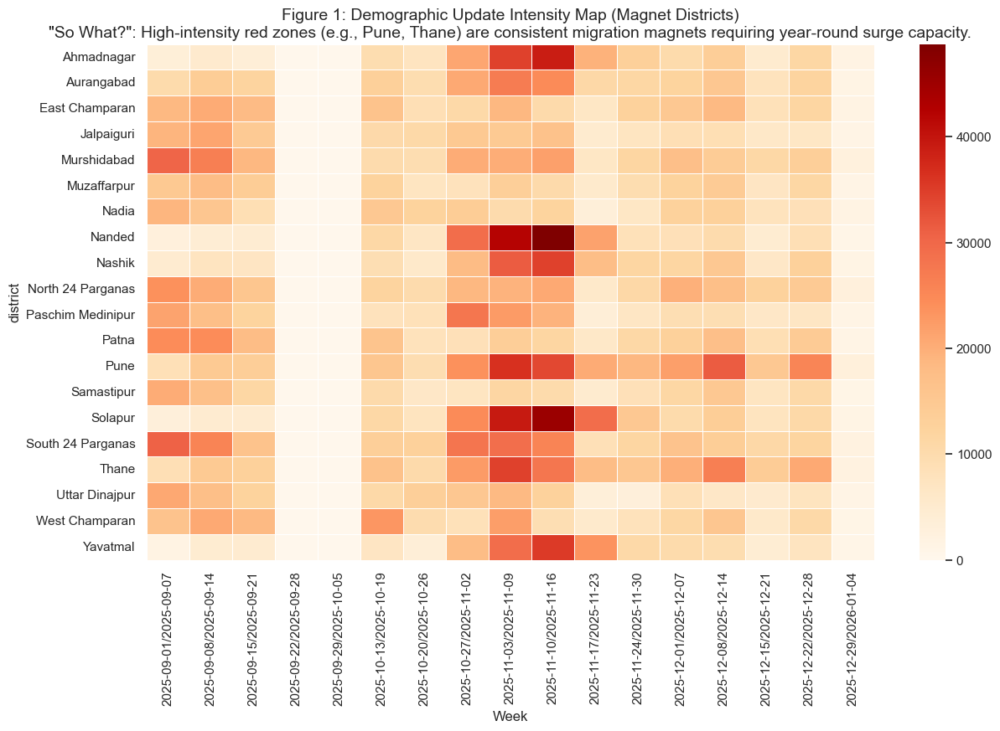

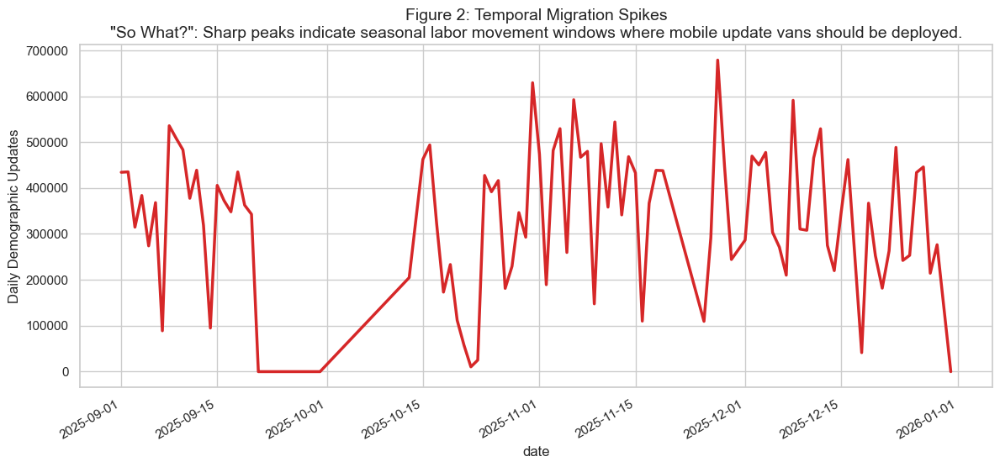

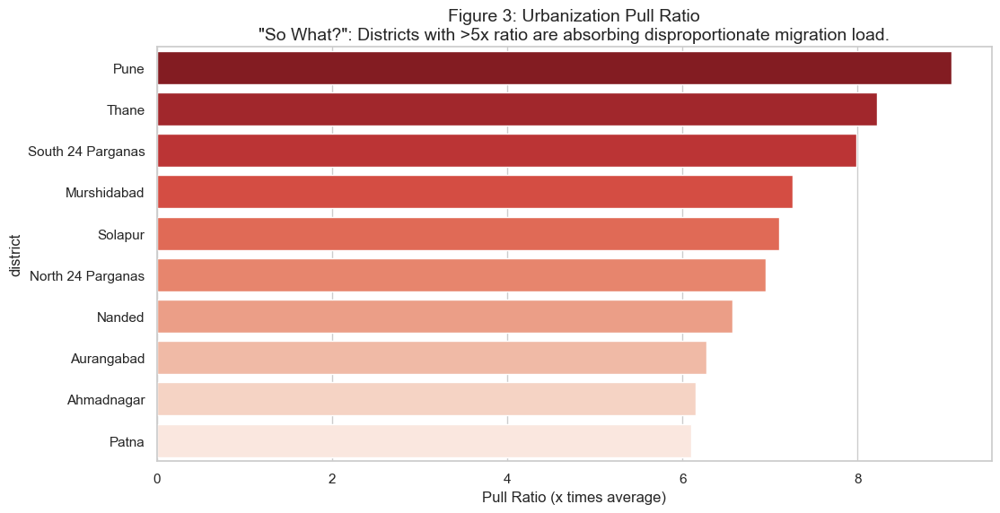

In [2]:
# 1. Heatmap: Magnet Districts (Migration Flux)
top_districts = master_df.groupby('district')['Total_Demographic'].sum().sort_values(ascending=False).head(20).index
heatmap_data = master_df[master_df['district'].isin(top_districts)].pivot_table(
    index='district', columns=master_df['date'].dt.to_period('W'), values='Total_Demographic', aggfunc='sum'
).fillna(0)
plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap='OrRd', linewidths=.5)
plt.title('Figure 1: Demographic Update Intensity Map (Magnet Districts)\n"So What?": High-intensity red zones (e.g., Pune, Thane) are consistent migration magnets requiring year-round surge capacity.', fontsize=14)
plt.xlabel('Week')
plt.show()

# 2. Line Chart: Migration Spikes
monthly_demo = master_df.groupby('date')['Total_Demographic'].sum()
plt.figure(figsize=(14, 6))
monthly_demo.plot(kind='line', color=COLOR_UPDATE, linewidth=2.5)
plt.title('Figure 2: Temporal Migration Spikes\n"So What?": Sharp peaks indicate seasonal labor movement windows where mobile update vans should be deployed.', fontsize=14)
plt.ylabel('Daily Demographic Updates')
plt.show()

# 3. Bar Chart: Urbanization Pull Ratio
district_stats = master_df.groupby('district').agg({'Total_Demographic': 'sum'}).reset_index()
avg_demo = district_stats['Total_Demographic'].mean()
district_stats['Pull_Ratio'] = district_stats['Total_Demographic'] / avg_demo
top_pull = district_stats.sort_values('Pull_Ratio', ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(data=top_pull, x='Pull_Ratio', y='district', hue='district', legend=False, palette='Reds_r')
plt.title('Figure 3: Urbanization Pull Ratio\n"So What?": Districts with >5x ratio are absorbing disproportionate migration load.', fontsize=14)
plt.xlabel('Pull Ratio (x times average)')
plt.show()

## 4. Angle B: The Digital Maturity Gap (Visuals)

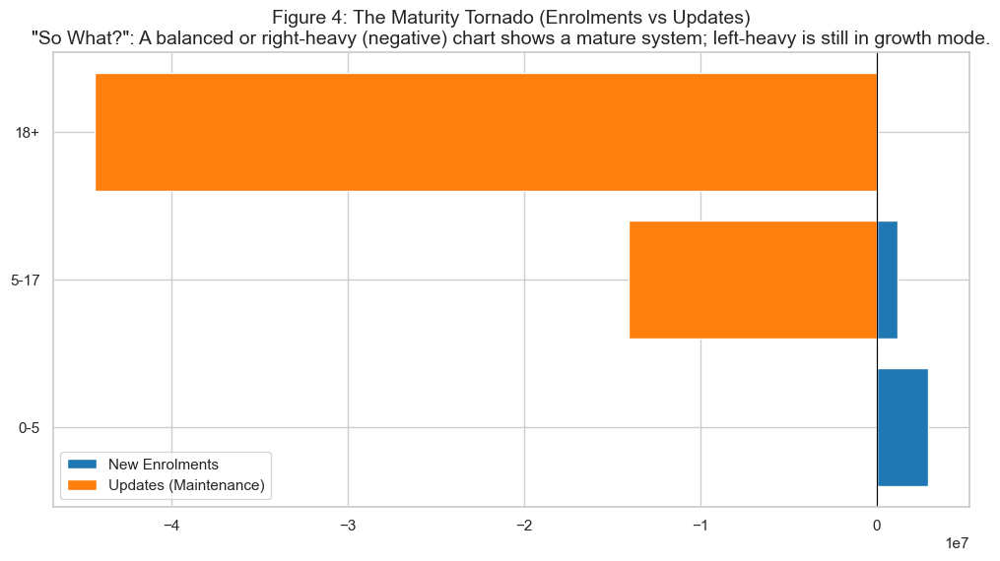

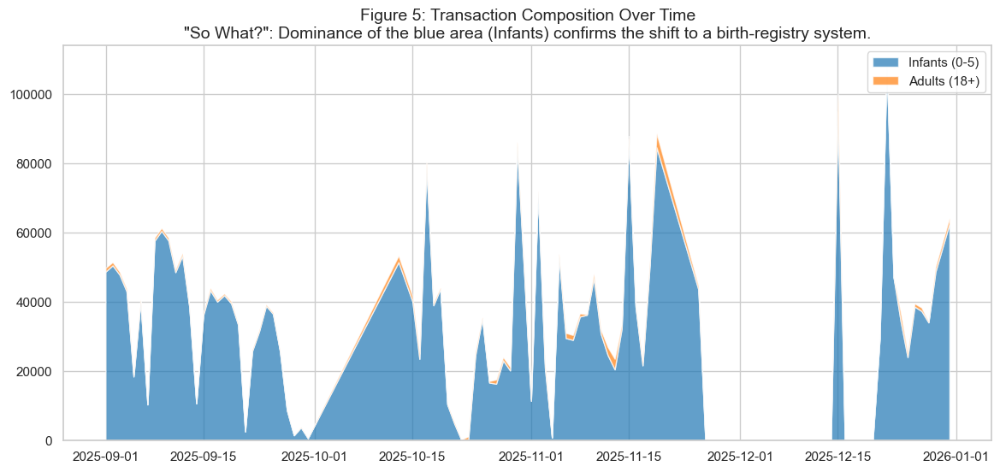

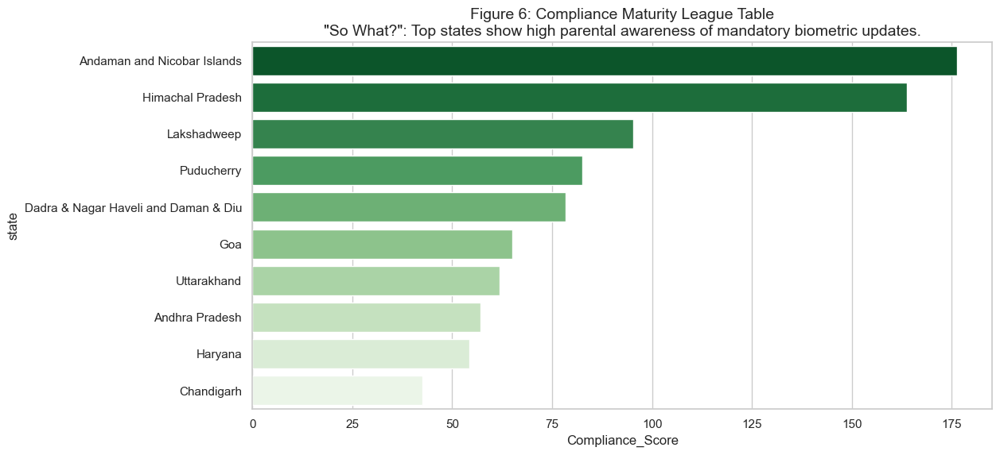

In [3]:
# 4. Tornado Chart (Pyramid): Enrolments vs Updates
pyramid_data = pd.DataFrame({
    'Category': ['0-5', '5-17', '18+'],
    'Enrolments': [master_df['age_0_5'].sum(), master_df['age_5_17'].sum(), master_df['age_18_greater'].sum()],
    'Updates': [0, master_df['bio_age_5_17'].sum(), master_df['bio_age_17_'].sum() + master_df['Total_Demographic'].sum()]
})
fig, ax = plt.subplots(figsize=(12, 6))
ax.barh(pyramid_data['Category'], pyramid_data['Enrolments'], color=COLOR_INFANT, label='New Enrolments')
ax.barh(pyramid_data['Category'], -pyramid_data['Updates'], color=COLOR_ADULT, label='Updates (Maintenance)')
ax.set_title('Figure 4: The Maturity Tornado (Enrolments vs Updates)\n"So What?": A balanced or right-heavy (negative) chart shows a mature system; left-heavy is still in growth mode.', fontsize=14)
ax.axvline(0, color='black', linewidth=0.8)
ax.legend()
plt.show()

# 5. Stacked Area Chart: Time Mix
monthly_mix = master_df.groupby('date')[['age_0_5', 'age_18_greater']].sum()
plt.figure(figsize=(14, 6))
plt.stackplot(monthly_mix.index, monthly_mix['age_0_5'], monthly_mix['age_18_greater'], labels=['Infants (0-5)', 'Adults (18+)'],
              colors=[COLOR_INFANT, COLOR_ADULT], alpha=0.7)
plt.title('Figure 5: Transaction Composition Over Time\n"So What?": Dominance of the blue area (Infants) confirms the shift to a birth-registry system.', fontsize=14)
plt.legend(loc='upper right')
plt.show()

# 6. Grouped Bar Chart: Compliance Maturity
state_comp = master_df.groupby('state')[['bio_age_5_17', 'age_5_17']].sum().reset_index()
state_comp['Compliance_Score'] = state_comp['bio_age_5_17'] / state_comp['age_5_17'].replace(0, 1)
top_states = state_comp.sort_values('Compliance_Score', ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(data=top_states, x='Compliance_Score', y='state', hue='state', legend=False, palette='Greens_r')
plt.title('Figure 6: Compliance Maturity League Table\n"So What?": Top states show high parental awareness of mandatory biometric updates.', fontsize=14)
plt.show()

## 5. Angle C: Service Accessibility (Visuals)

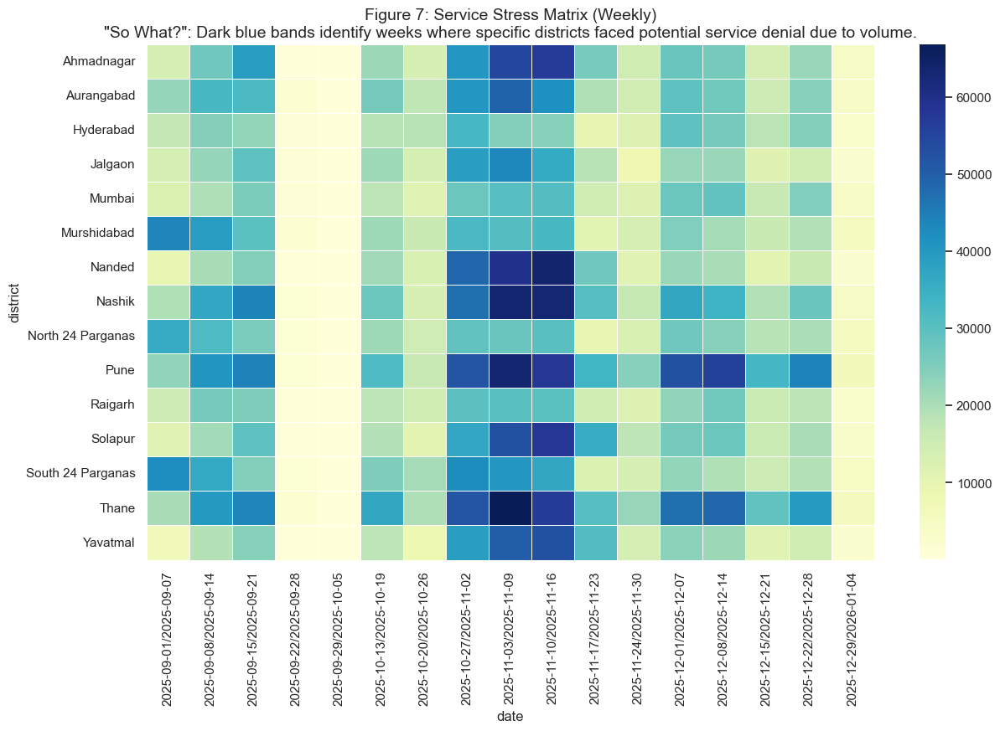

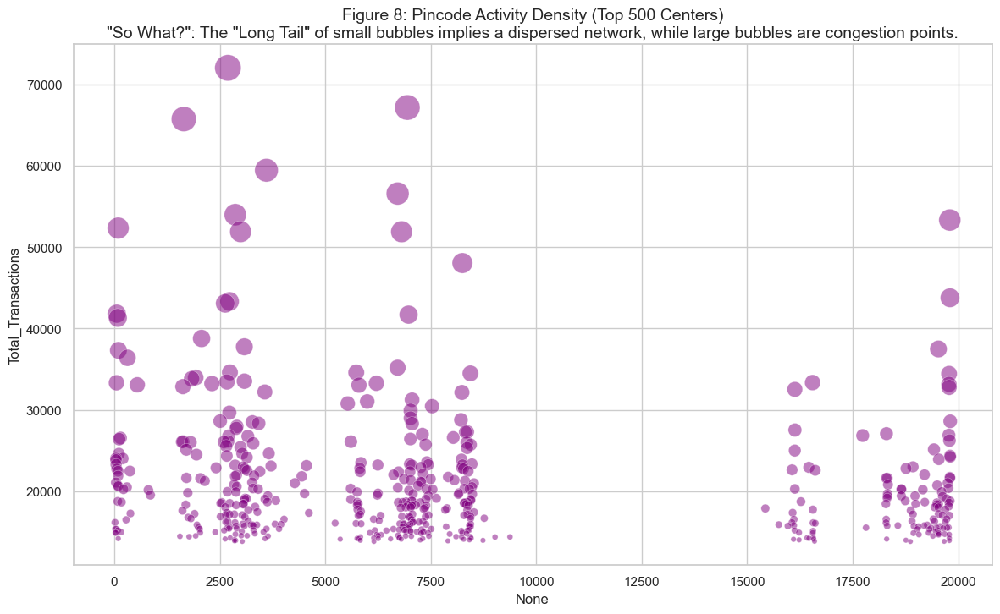

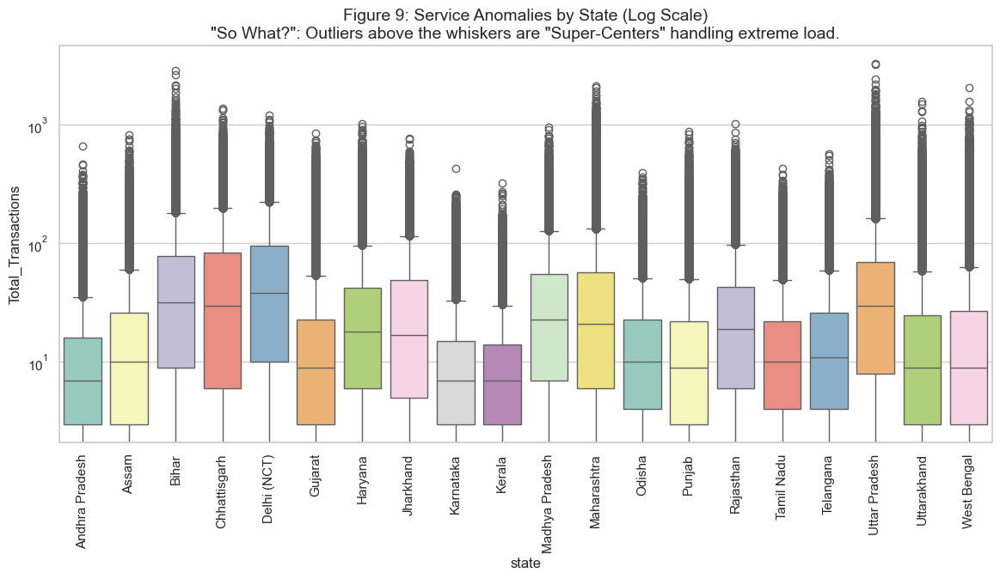

In [4]:
# 7. Matrix Heatmap: Stress/Overload
top_busy = master_df.groupby('district')['Total_Transactions'].sum().sort_values(ascending=False).head(15).index
busy_heatmap = master_df[master_df['district'].isin(top_busy)].pivot_table(
    index='district', columns=master_df['date'].dt.to_period('W'), values='Total_Transactions', aggfunc='sum'
).fillna(0)
plt.figure(figsize=(14, 8))
sns.heatmap(busy_heatmap, cmap='YlGnBu', linewidths=.5)
plt.title('Figure 7: Service Stress Matrix (Weekly)\n"So What?": Dark blue bands identify weeks where specific districts faced potential service denial due to volume.', fontsize=14)
plt.show()

# 8. Bubble Chart: Pincode Density
pincode_stat = master_df.groupby('pincode')['Total_Transactions'].sum().reset_index()
pincode_stat = pincode_stat.sort_values('Total_Transactions', ascending=False).head(500)
plt.figure(figsize=(14, 8))
sns.scatterplot(data=pincode_stat, x=pincode_stat.index, y='Total_Transactions', size='Total_Transactions', sizes=(20, 500), color='purple', alpha=0.5, legend=False)
plt.title('Figure 8: Pincode Activity Density (Top 500 Centers)\n"So What?": The "Long Tail" of small bubbles implies a dispersed network, while large bubbles are congestion points.', fontsize=14)
plt.show()

# 9. Box Plot: Anomalies
plt.figure(figsize=(14, 6))
top_20_states = master_df.groupby('state')['Total_Transactions'].sum().sort_values(ascending=False).head(20).index
filtered_df = master_df[master_df['state'].isin(top_20_states)]
sns.boxplot(data=filtered_df, x='state', y='Total_Transactions', hue='state', legend=False, palette='Set3')
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('Figure 9: Service Anomalies by State (Log Scale)\n"So What?": Outliers above the whiskers are "Super-Centers" handling extreme load.', fontsize=14)
plt.show()

## 6. Strategic Action Framework (The Command Center)

In [ ]:

print("Step 1: Loading GeoJSON for India Map...")
geojson_url = "https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson"
try:
    with urlopen(geojson_url) as response:
        india_states = json.load(response)
    print("GeoJSON loaded successfully.")
except Exception as e:
    print(f"CRITICAL ERROR: Could not load GeoJSON. Details: {e}")
    india_states = None


df = master_df.groupby('state').agg({
    'age_0_5': 'sum', 'Total_Enrolment': 'sum',
    'bio_age_5_17': 'sum', 'age_5_17': 'sum',
    'demo_age_17_': 'sum', 'Total_Demographic': 'sum',
    'Total_Transactions': 'sum'
}).reset_index()


df['Child_Rate'] = df['age_0_5'] / df['Total_Enrolment'].replace(0, 1)
df['Comp_Rate'] = df['bio_age_5_17'] / df['age_5_17'].replace(0, 1)
df['Flux_Index'] = df['demo_age_17_'] / df['Total_Demographic'].replace(0, 1)


ps = master_df[['pincode', 'state', 'Total_Transactions']].groupby(['state', 'pincode']).sum().reset_index()
dr = (ps[ps['Total_Transactions'] < 20].groupby('state')['pincode'].count() / ps.groupby('state')['pincode'].count()).fillna(0).reset_index(name='Desert_Rate')
df = pd.merge(df, dr, on='state', how='left').fillna(0)

try:
    df['Strategic_Action'] = pd.qcut(df['Child_Rate'], 5, labels=[
        'Priority 1: Immediate Growth Support',        
        'Priority 2: Mandatory Lifecycle Compliance',
        'Priority 3: Urban Integration Services',
        'Priority 4: Mobile Access Intervention',
        'Maintenance: Baseline Monitoring'            
    ])
    
except:
    df['Strategic_Action'] = 'Maintenance: Baseline Monitoring'


palette = {
    'Priority 1: Immediate Growth Support': '#E63946',         # Red
    'Priority 2: Mandatory Lifecycle Compliance': '#F4A261',   # Orange
    'Priority 3: Urban Integration Services': '#457B9D',       # Blue
    'Priority 4: Mobile Access Intervention': '#FFB703',       # Yellow
    'Maintenance: Baseline Monitoring': '#2A9D8F'              # Green
}

import plotly.io as pio
pio.renderers.default = "notebook"

map_bridge = {
    "Jammu and Kashmir": "Jammu & Kashmir",
    "Jammu And Kashmir": "Jammu & Kashmir",
    "Delhi (NCT)": "Delhi",
    "NCT of Delhi": "Delhi",
    "Nct Of Delhi": "Delhi",
    "Delhi": "Delhi",
    "Andaman and Nicobar Islands": "Andaman & Nicobar",
    "Andaman And Nicobar Islands": "Andaman & Nicobar",
    "Andaman & Nicobar Island": "Andaman & Nicobar",
    "Dadra and Nagar Haveli": "Dadra and Nagar Haveli and Daman and Diu",
    "Daman and Diu": "Dadra and Nagar Haveli and Daman and Diu",
    "Dadra And Nagar Haveli": "Dadra and Nagar Haveli and Daman and Diu",
    "Daman And Diu": "Dadra and Nagar Haveli and Daman and Diu",
    "Telangana": "Telangana",
    "Ladakh": "Ladakh"
}
df['map_state'] = df['state'].replace(map_bridge)


if india_states:
    print("Generating Choropleth Map...")
    fig = px.choropleth(
        df, 
        geojson=india_states, 
        featureidkey='properties.ST_NM', 
        locations='map_state', 
        color='Strategic_Action', 
        color_discrete_map=palette,
        hover_name='state', 
        hover_data=['Child_Rate', 'Comp_Rate', 'Flux_Index', 'Desert_Rate'],
        category_orders={
            "Strategic_Action": [
                "Priority 1: Immediate Growth Support",
                "Priority 2: Mandatory Lifecycle Compliance",
                "Priority 3: Urban Integration Services",
                "Priority 4: Mobile Access Intervention",
                "Maintenance: Baseline Monitoring"
            ]
        }
    )

    fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(
        title_text='Administrative Priority Framework by State (Quantile Distributed)',
        legend_title_text='Strategic Action',
        margin={"r":0,"t":50,"l":0,"b":0},
        mapbox_style="carto-positron"
    )
    fig.show()
    print("Map successfully generated.")
else:
    print("Skipping Map Generation due to missing GeoJSON data.")

Step 1: Loading GeoJSON for India Map...
GeoJSON loaded successfully.
Generating Choropleth Map...


Map successfully generated.
